In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pipeline import get_fitted_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, classification_report, roc_curve, auc
from sklearn.inspection import permutation_importance
import warnings
from sklearn.exceptions import ConvergenceWarning
from xgboost import XGBClassifier
from xgboost.callback import EarlyStopping
from lightgbm import LGBMClassifier, early_stopping, log_evaluation
import shap
import xgboost as xgb, inspect
import sys, os


warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)


/Users/loganheydt/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print("python:", sys.executable)
print("xgboost version:", xgb.__version__)
print("xgboost file:", xgb.__file__)
print("fit signature:", inspect.signature(XGBClassifier().fit))

python: /Library/Developer/CommandLineTools/usr/bin/python3
xgboost version: 2.1.4
xgboost file: /Users/loganheydt/Library/Python/3.9/lib/python/site-packages/xgboost/__init__.py
fit signature: (X: Any, y: Any, *, sample_weight: Optional[Any] = None, base_margin: Optional[Any] = None, eval_set: Optional[Sequence[Tuple[Any, Any]]] = None, verbose: Union[bool, int, NoneType] = True, xgb_model: Union[xgboost.core.Booster, str, xgboost.sklearn.XGBModel, NoneType] = None, sample_weight_eval_set: Optional[Sequence[Any]] = None, base_margin_eval_set: Optional[Sequence[Any]] = None, feature_weights: Optional[Any] = None) -> 'XGBClassifier'


In [3]:
raw_df = pd.read_csv(r"/Users/loganheydt/Desktop/data/GitHub/Titanic-Prediction/data/test.csv")

df = pd.read_csv(r"/Users/loganheydt/Desktop/data/GitHub/Titanic-Prediction/data/train.csv")

In [4]:
df.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [5]:
# train test split

y = df['Survived']
x = df.drop(columns='Survived')

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.3, random_state=42)

fitted_pipeline, x_train_transformed = get_fitted_pipeline(x_train)

x_test_transformed = fitted_pipeline.transform(x_test)

In [6]:
_, modeling_df = get_fitted_pipeline(df.copy())
modeling_df['Survived'] = df['Survived'].values

In [7]:
modeling_df.head()

,Age,Fare,family_size,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Embarked_nan,cabin_level_A,...,cabin_level_D,cabin_level_E,cabin_level_F,cabin_level_G,cabin_level_T,cabin_level_nan,disting_title,is_child,is_alone,Survived
0,-0.592481,-0.502445,0.059160,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0
1,0.638789,0.786845,0.059160,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1
2,-0.284663,-0.488854,-0.560975,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,1,1
3,0.407926,0.420730,0.059160,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1
4,0.407926,-0.486337,-0.560975,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0,0,1,0


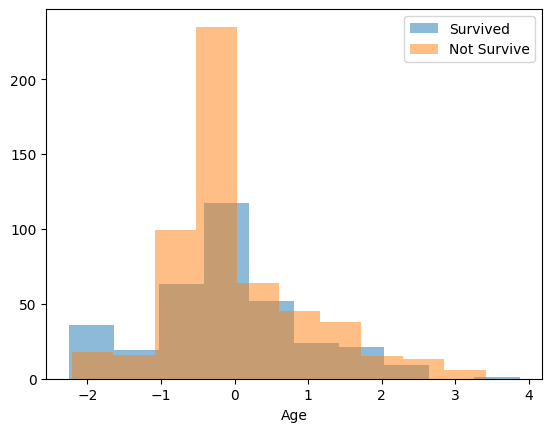

In [8]:
survived = modeling_df[modeling_df['Survived'] == 1]
not_survive = modeling_df[modeling_df['Survived'] == 0]

plt.hist(survived['Age'], alpha=.5, label='Survived')
plt.hist(not_survive['Age'], alpha=.5,  label= 'Not Survive')
plt.xlabel('Age')
plt.legend()
plt.show()

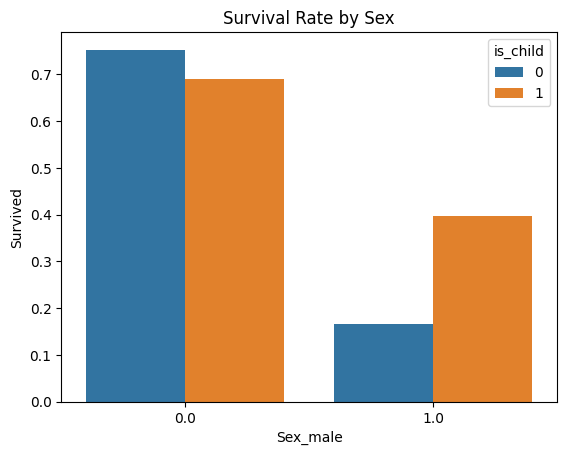

In [9]:
sns.barplot(x='Sex_male', y='Survived', hue='is_child', data=modeling_df, errorbar=None)
plt.title("Survival Rate by Sex")
plt.show()

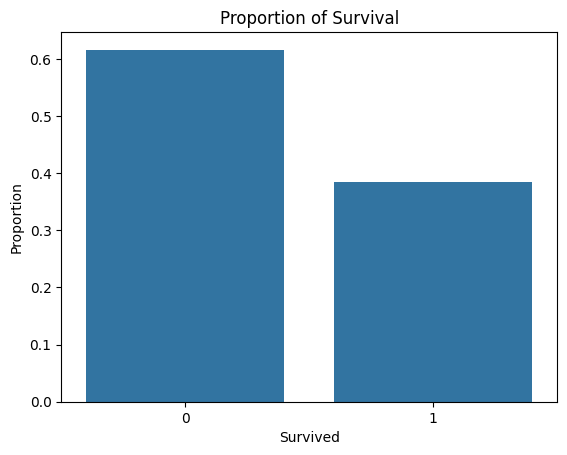

In [10]:
target_dist = pd.DataFrame(modeling_df['Survived'].value_counts(normalize=True))

target_dist.columns = ['Proportion']

sns.barplot(x='Survived', y='Proportion', data=target_dist)
plt.title('Proportion of Survival')
plt.xlabel('Survived')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.show()

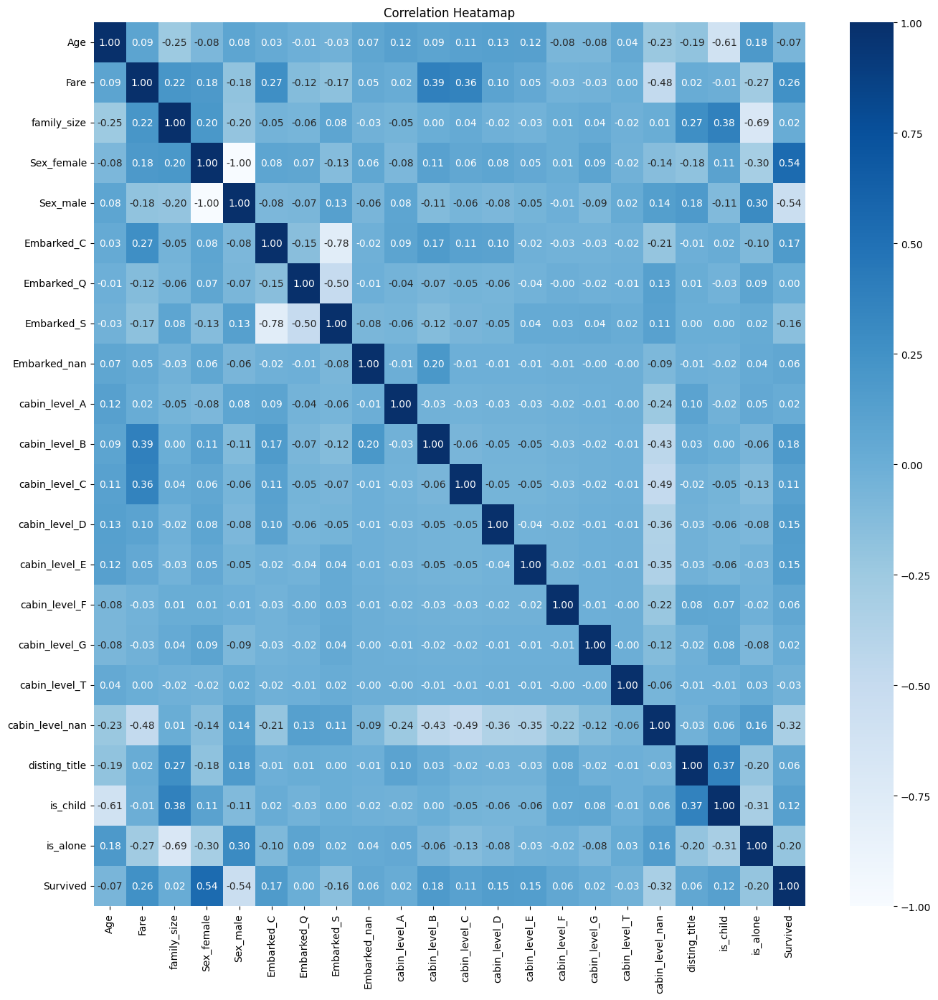

In [11]:
# corr_df = modeling_df.drop(columns=drop_cols).copy()

plt.figure(figsize=(16,16))
corr =  modeling_df.corr()
sns.heatmap(corr, cmap='Blues', annot=True, fmt=".2f")
plt.title("Correlation Heatamap")
plt.show()

# Logistic Regression

In [12]:
# Logistict Regression and Parameter grid

param_grid = [
    # solvers that only support l2 or none
    {
        'penalty': ['l2', None],
        'solver': ['lbfgs', 'newton-cg', 'sag'],
        'C': np.logspace(-4, 4, 20),
        'max_iter': [100, 1000, 2500, 5000]
    },
    # liblinear supports l1 and l2
    {
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear'],
        'C': np.logspace(-4, 4, 20),
        'max_iter': [100, 1000, 2500, 5000]
    },
    # saga supports all penalties but elasticnet requires l1_ratio
    {
        'penalty': ['l1', 'l2'],
        'solver': ['saga'],
        'C': np.logspace(-4, 4, 20),
        'max_iter': [100, 1000, 2500, 5000]
    },
    # elasticnet with saga (requires l1_ratio)
    {
        'penalty': ['elasticnet'],
        'solver': ['saga'],
        'l1_ratio': [0.1, 0.5, 0.9],
        'C': np.logspace(-4, 4, 20),
        'max_iter': [100, 1000, 2500, 5000]
    }
]

model = LogisticRegression(max_iter=2000, class_weight=None, random_state=42)

clf = GridSearchCV(model, param_grid=param_grid, cv=3, verbose=0, scoring='accuracy', n_jobs=-1, error_score='raise')

best_model = clf.fit(
    x_train_transformed, 
    y_train)

log_reg = best_model.best_estimator_

/Users/loganheydt/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/loganheydt/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/loganheydt/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/loganheydt/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/loganheydt/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/loganheydt/Library

In [13]:
feature_names = x_train_transformed.columns

coefs = pd.DataFrame({'feature': feature_names,
                      'coefficient': log_reg.coef_[0]})

coefs.to_clipboard()
coefs

,feature,coefficient
0,Age,-0.125216
1,Fare,0.382118
2,family_size,-0.629882
3,Sex_female,1.220923
4,Sex_male,-1.212649
5,Embarked_C,0.311701
6,Embarked_Q,-0.031615
7,Embarked_S,-0.189474
8,Embarked_nan,0.000000
9,cabin_level_A,0.000000


In [14]:
perm_import = permutation_importance(
    log_reg, 
    x_test_transformed, 
    y_test, 
    n_repeats=30, 
    random_state=42,
    scoring="accuracy")

perm_df = pd.DataFrame({
    "feature": feature_names,
    "importance_mean": perm_import.importances_mean,
    "importance_std": perm_import.importances_std
}).sort_values("importance_mean", ascending=False)

perm_df.to_clipboard()
perm_df

,feature,importance_mean,importance_std
3,Sex_female,0.058013,0.014466
4,Sex_male,0.056129,0.014102
2,family_size,0.034808,0.006233
17,cabin_level_nan,0.032591,0.009429
1,Fare,0.018100,0.006865
18,disting_title,0.011299,0.003912
20,is_alone,0.003298,0.004986
0,Age,0.003048,0.005575
5,Embarked_C,0.000975,0.003839
6,Embarked_Q,0.000241,0.000611


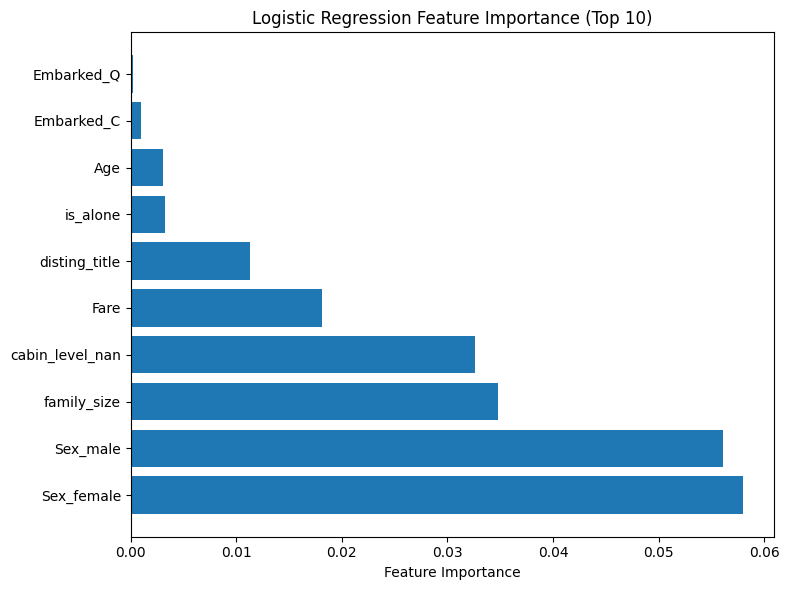

In [15]:
log_reg_import = perm_df[['feature', 'importance_mean']].sort_values('importance_mean', ascending=False)
log_reg_import = log_reg_import.head(10)

plt.figure(figsize=(8,6))
plt.barh(log_reg_import['feature'], log_reg_import['importance_mean'])
plt.xlabel("Feature Importance")
plt.title("Logistic Regression Feature Importance (Top 10)")
plt.tight_layout()
plt.show()

In [16]:
y_pred_best = best_model.predict(x_test_transformed)

print("Classification Report WITH Hyperparameter tuning")
print(classification_report(y_test, y_pred_best))

Classification Report WITH Hyperparameter tuning
              precision    recall  f1-score   support

           0       0.82      0.87      0.85       157
           1       0.80      0.73      0.76       111

    accuracy                           0.81       268
   macro avg       0.81      0.80      0.80       268
weighted avg       0.81      0.81      0.81       268



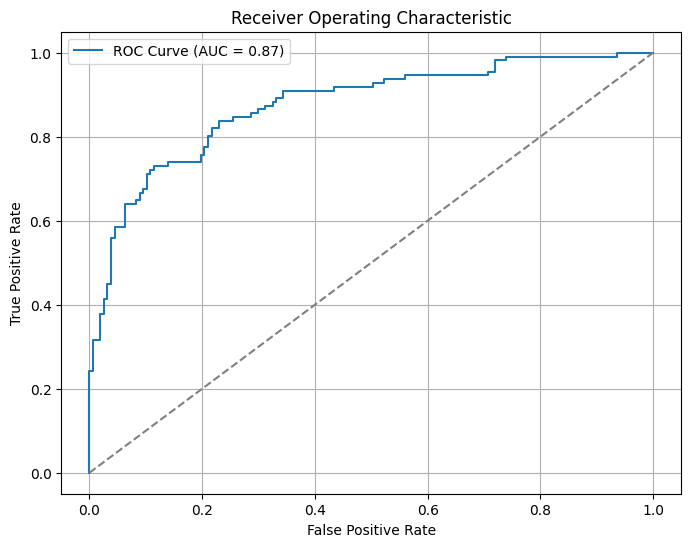

In [17]:
y_prob = best_model.predict_proba(x_test_transformed)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend()
plt.grid(True)
plt.show()

## Summary of Logistic Regression
### Model info
A logistic regression is a regression that predicts the probability of an event. The probability is then taken and is interpreted to be "yes, the event will happen" or "no, the event will not happen" (classification).

### Feature importance:
 Permutation importance: Randomly shuffles the values of one feature at a time and monitors for change in accuracy. If the accuracy drops, the feature is important. If the accuracy does does not change much, the feature has lower importance.
#### Output Summary
- Sex_female is the most important feature
    - Follows the "Woman and children first" idea
- family_size is highly important
- is_child shows very low importance
    - Very interesting to see considering the "Woman and children first" idea


## Model Performance 
### Accuracy: 81%
### AUC = 87%








# XGBoost

In [18]:
# XGBoost and Parameter grid

param_grid_xgb = {
    "n_estimators": [200, 400, 800],
    "learning_rate": [0.03, 0.1],
    "max_depth": [3, 5],
    "min_child_weight": [1, 5],
    "gamma": [0, 1],
    "subsample": [0.8],
    "colsample_bytree": [0.8],
    "reg_alpha": [0, 0.1],
    "reg_lambda": [1, 10],
}

model = XGBClassifier(
    tree_method="hist",
    n_jobs=1,
    eval_metric='error',
    verbosity=0,
    random_state=42,
)


clf = GridSearchCV(
    estimator=model,
    param_grid=param_grid_xgb,
    cv=3,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1,
    pre_dispatch=16,
    error_score="raise",
)


best_model = clf.fit(
    x_train_transformed, 
    y_train,
    eval_set= [(x_test_transformed, y_test)])


xgb_best = best_model.best_estimator_
booster  = xgb_best.get_booster()


Fitting 3 folds for each of 192 candidates, totalling 576 fits
[0]	validation_0-error:0.41418
[1]	validation_0-error:0.41418
[2]	validation_0-error:0.41418
[3]	validation_0-error:0.41418
[4]	validation_0-error:0.41418
[5]	validation_0-error:0.41418
[6]	validation_0-error:0.41418
[7]	validation_0-error:0.41418
[8]	validation_0-error:0.41418
[9]	validation_0-error:0.39179
[10]	validation_0-error:0.34328
[11]	validation_0-error:0.32836
[12]	validation_0-error:0.29104
[13]	validation_0-error:0.26493
[14]	validation_0-error:0.24627
[15]	validation_0-error:0.24254
[16]	validation_0-error:0.22761
[17]	validation_0-error:0.22761
[18]	validation_0-error:0.22761
[19]	validation_0-error:0.22761
[20]	validation_0-error:0.22761
[21]	validation_0-error:0.22761
[22]	validation_0-error:0.22761
[23]	validation_0-error:0.22761
[24]	validation_0-error:0.22761
[25]	validation_0-error:0.22761
[26]	validation_0-error:0.22761
[27]	validation_0-error:0.22761
[28]	validation_0-error:0.21642
[29]	validation_0-e

In [19]:
# Feature importance for XGBoost
importance_gain = booster.get_score(importance_type='gain')
importance_weight = booster.get_score(importance_type='weight')
importance_cover = booster.get_score(importance_type='cover')

boost_import = pd.DataFrame.from_dict(importance_gain, orient='index', columns=['gain']).reset_index()
boost_import = boost_import.rename(columns={'index': 'feature'}).sort_values('gain', ascending=False)

boost_import

,feature,gain
3,Sex_female,13.769416
4,Sex_male,11.724111
13,cabin_level_nan,4.604827
2,family_size,2.811729
14,disting_title,2.180989
12,cabin_level_E,2.179168
8,cabin_level_A,2.158564
1,Fare,2.071389
0,Age,1.877211
5,Embarked_C,1.826876


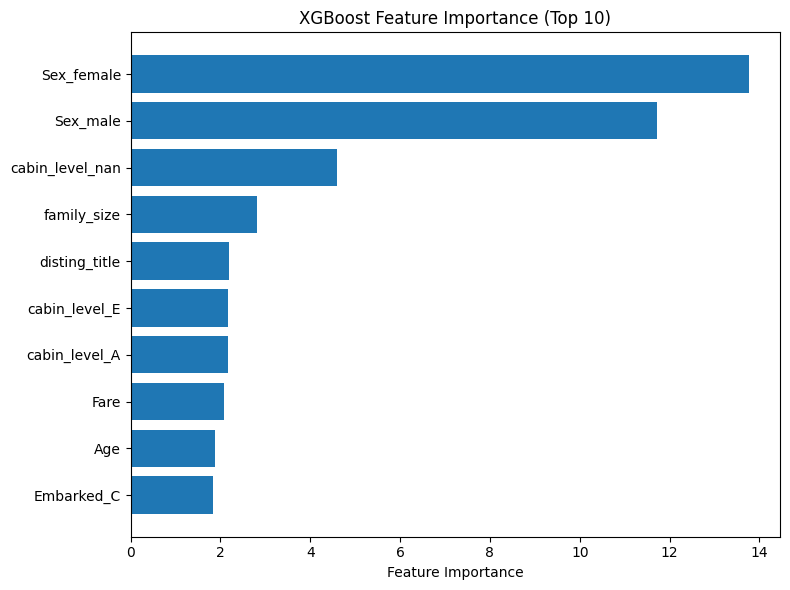

In [20]:
boost_10 = boost_import.head(10)
boost_10 = boost_10.sort_values('gain', ascending=True)

plt.figure(figsize=(8,6))
plt.barh(boost_10['feature'], boost_10['gain'])
plt.xlabel("Feature Importance")
plt.title("XGBoost Feature Importance (Top 10)")
plt.tight_layout()
plt.show()

In [21]:
y_pred_best = best_model.predict(x_test_transformed)

print("Classification Report WITH Hyperparameter tuning")
print(classification_report(y_test, y_pred_best))

Classification Report WITH Hyperparameter tuning
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       157
           1       0.81      0.73      0.77       111

    accuracy                           0.82       268
   macro avg       0.82      0.80      0.81       268
weighted avg       0.82      0.82      0.82       268



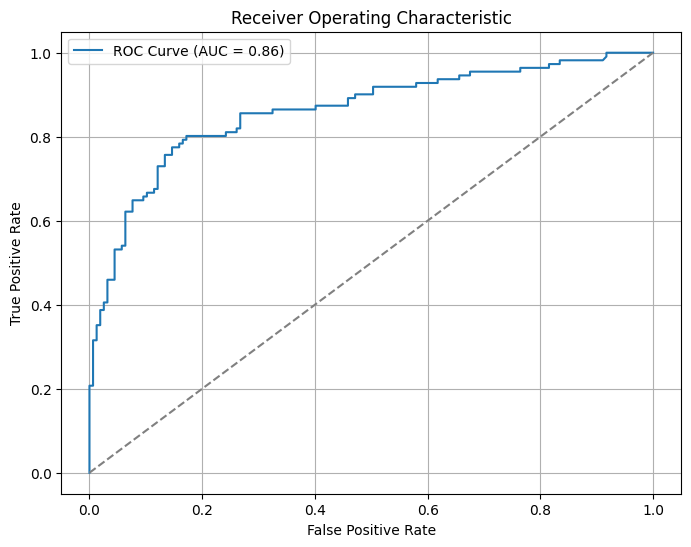

In [22]:
y_prob = best_model.predict_proba(x_test_transformed)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend()
plt.grid(True)
plt.show()

## Summary of XGBoost
### Model info
XGBoost is a gradient boosting framework: builds multiple decision trees that learns from the previous one

### Importance Gain:
#### Description:
- Importance gain indicates predictive power within the trees

#### Output Summary
- Gender is the most important features
    - Follows the "Woman and children first" idea
- Cabin level A is very important
    - Level A likely being a higher level on the ship, making evacuation more accessible
- is_child and disting_title have moderately high importance
    - Indicates children and higher societal class were let off


## Model Performance 
### Accuracy: 82%
### AUC = 86%


# LightGBM

In [23]:
param_grid_lgbm = {
    "num_leaves": [31, 63],
    "max_depth": [-1, 6],              
    "min_child_samples": [20, 50],
    "learning_rate": [0.02, 0.1],
    "subsample": [0.8],                 
    "subsample_freq": [1],              
    "colsample_bytree": [0.8],          
    "reg_alpha": [0, 0.1],              
    "reg_lambda": [1, 10],              
}


model = LGBMClassifier(
    objective="binary",
    metric="binary_error",
    n_estimators=5000,      
    num_threads=1,          
    random_state=42
)

clf = GridSearchCV(
    estimator=model, 
    param_grid=param_grid_lgbm, 
    cv=3, 
    scoring="accuracy", 
    n_jobs=-1, 
    error_score="raise",
    pre_dispatch=16
    )

best_model = clf.fit(
    x_train_transformed, 
    y_train,
    eval_set= [(x_test_transformed, y_test)],
    callbacks=[
        early_stopping(stopping_rounds=100),
        log_evaluation(period=0)
    ])

[LightGBM] [Info] Number of positive: 154, number of negative: 261
[LightGBM] [Info] Number of positive: 154, number of negative: 262
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 162
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 415, number of used features: 14
[LightGBM] [Info] Number of data points in the train set: 416, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370192 -> initscore=-0.531392
[LightGBM] [Info] Start training from score -0.531392
[LightGBM] [Info] [binary:BoostF

In [24]:
# Feature importance for LightGBM
lgb_model = best_model.best_estimator_

importance_gain = lgb_model.booster_.feature_importance(importance_type='gain')
importance_split = lgb_model.booster_.feature_importance(importance_type='split')

feature_imp_df = pd.DataFrame({
    'feature': lgb_model.booster_.feature_name(),
    'importance_gain': importance_gain,
    'importance_split': importance_split
}).sort_values(by='importance_gain', ascending=False)

feature_imp_df.to_clipboard()
# feature_imp_df

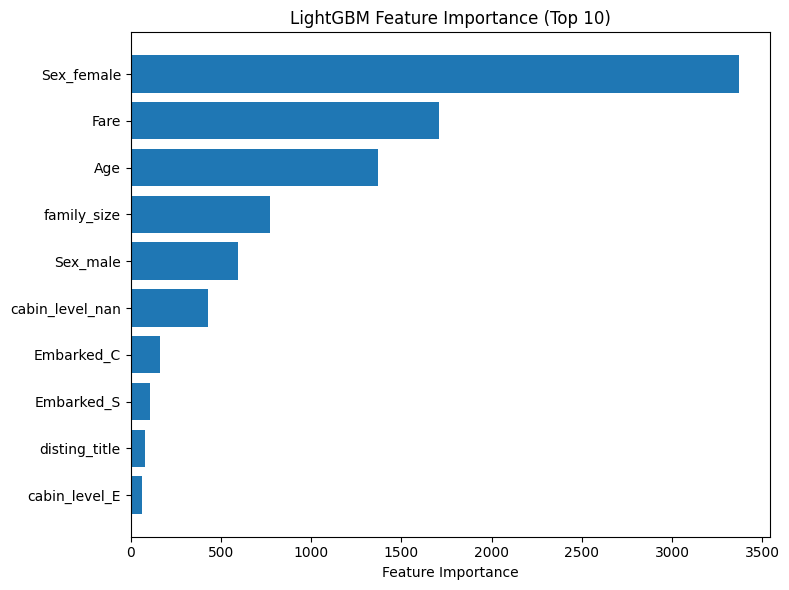

In [25]:
feat_import_lgb = feature_imp_df[['feature', 'importance_gain']]
feat_import_lgb = feat_import_lgb.sort_values(by='importance_gain', ascending=False)
feat_import_lgb = feat_import_lgb.head(10)
feat_import_lgb = feat_import_lgb.sort_values('importance_gain', ascending=True)

plt.figure(figsize=(8,6))
plt.barh(feat_import_lgb['feature'], feat_import_lgb['importance_gain'])
plt.xlabel("Feature Importance")
plt.title("LightGBM Feature Importance (Top 10)")
plt.tight_layout()
plt.show()


In [26]:
y_pred_best = best_model.predict(x_test_transformed)

print("Classification Report WITH Hyperparameter tuning")
print(classification_report(y_test, y_pred_best))

Classification Report WITH Hyperparameter tuning
              precision    recall  f1-score   support

           0       0.82      0.89      0.86       157
           1       0.83      0.73      0.78       111

    accuracy                           0.82       268
   macro avg       0.83      0.81      0.82       268
weighted avg       0.82      0.82      0.82       268



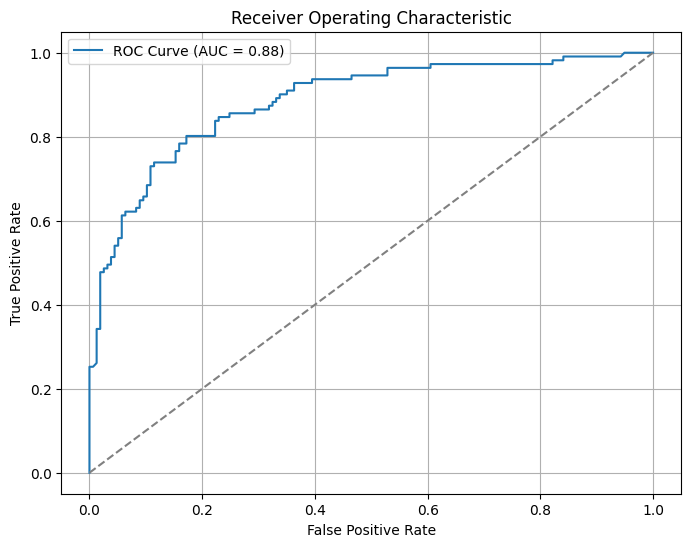

In [27]:
y_prob = best_model.predict_proba(x_test_transformed)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend()
plt.grid(True)
plt.show()

## Summary of LightGBM
### Model info
- Gradient boosting framework: builds multiple decision trees that learns from the previous one
- Instead of growing level by level (like XGBoost), grows by choosing the leaf that reduces loss the most
    - leads to deeper, more accurate trees with fewer number of trees
- Can handle categorical features natively

### Feature gain and split:
#### Description:
- Feature gain indicates predictive power within the trees
- Feature split measures how frequently the feature is used as a node within the trees
#### Output Summary
- Sex_female is the most predictive feature (high importance gain)
    - moderate importance split (how often it is  used wihtin the trees)
    - Follows the "Woman and children first" idea
- Fare is the second most predictive feature and has the highest split
- Age also is high in both predictve power and splits
    - Follows the "Woman and children first" idea
- The features show moderate predictive power and splits
    - family_size
    - Sex_male
    - cabin_level_nan
    - Embarked_C
- These features are low in gain and split:
    - disting_title
    - Embarked_S
    - is_child
    - is_alone
    - cabin_level_E
    - cabin_level_C
    - cabin_level_B

## Model Performance 
### Accuracy: 82%
### AUC = 88%

